In [1]:
! pip install -q kaggle
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"ptfrwrd","key":"4a2f5a982ed53062345976efa42bd4c8"}'}

In [2]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

In [3]:
#  ! kaggle competitions list

! kaggle competitions download -c house-prices-advanced-regression-techniques

# kaggle competitions submit -c [COMPETITION] -f [FILE] -m [MESSAGE]: make a competition submission

  0% 0.00/450k [00:00<?, ?B/s]
100% 450k/450k [00:00<00:00, 67.5MB/s]
  0% 0.00/13.1k [00:00<?, ?B/s]
100% 13.1k/13.1k [00:00<00:00, 13.7MB/s]
  0% 0.00/31.2k [00:00<?, ?B/s]
100% 31.2k/31.2k [00:00<00:00, 32.1MB/s]
  0% 0.00/441k [00:00<?, ?B/s]
100% 441k/441k [00:00<00:00, 61.9MB/s]


**Import libs:**

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')

import warnings
warnings.simplefilter(action='ignore')

from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score, GridSearchCV, KFold, RandomizedSearchCV, train_test_split
import math
import sklearn.model_selection as ms
import sklearn.metrics as sklm

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [5]:
# use this code to show all columns
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# **1 - Exploratory data analysis (EDA)**


Let`s see the data:

In [89]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

In [90]:
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [91]:
print('Shape: ', train.shape )

Shape:  (1460, 81)


In [92]:
print('Numerical types: ', train.select_dtypes(include='number').columns)
print('Categorial types: ', train.select_dtypes(include='object').columns)
print('Number of numerical types: ', len(train.select_dtypes(include='number').columns))
print('Number of categorial types: ', len(train.select_dtypes(include='object').columns))

Numerical types:  Index(['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')
Categorial types:  Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1'

Let`s create boxplots for detecting outliers.

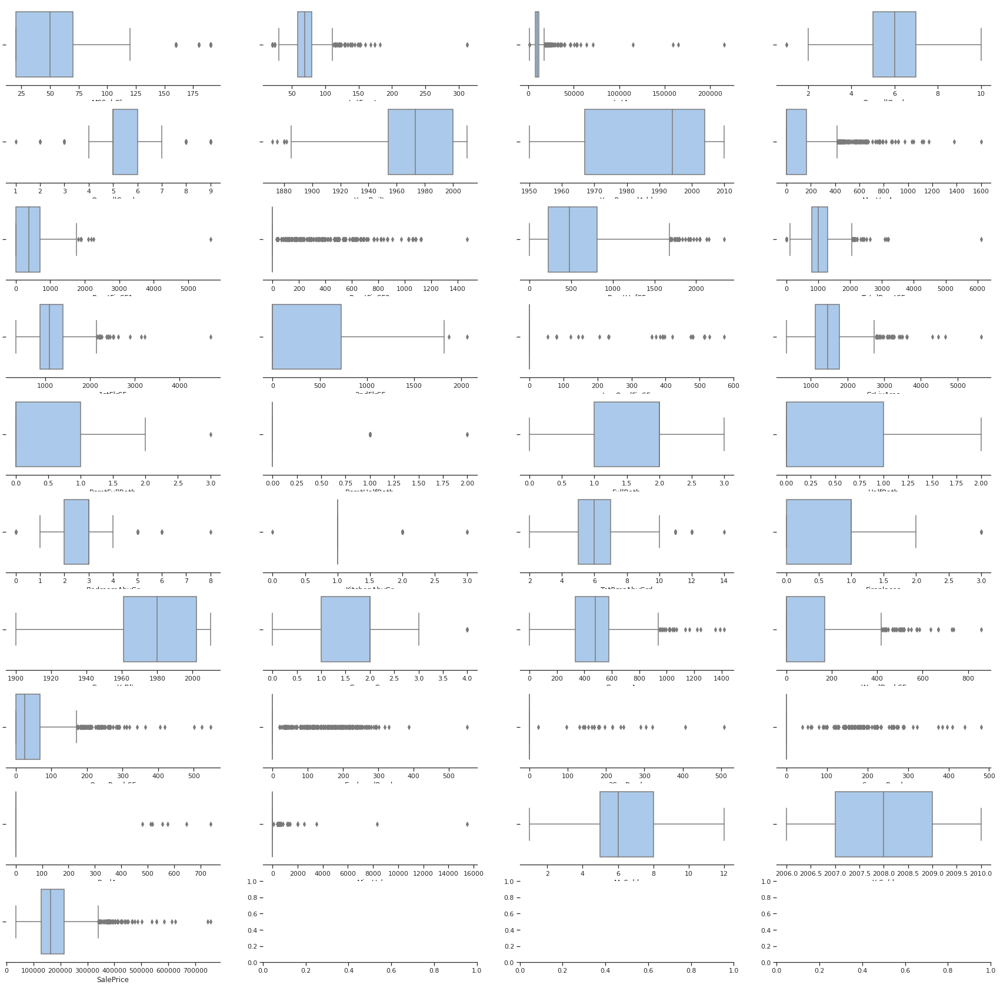

In [93]:
sns.set(style="ticks", palette="pastel")

f, axes = plt.subplots(10, 4, figsize=(30, 30))
sns.despine(left=True)
data =  pd.DataFrame(train.select_dtypes(include='number'))

sns.boxplot(data.iloc[:, 1],  ax=axes[0, 0])
sns.boxplot(data.iloc[:, 2],  ax=axes[0, 1])
sns.boxplot(data.iloc[:, 3],  ax=axes[0, 2])
sns.boxplot(data.iloc[:, 4],  ax=axes[0, 3])

sns.boxplot(data.iloc[:, 5],  ax=axes[1, 0])
sns.boxplot(data.iloc[:, 6],  ax=axes[1, 1])
sns.boxplot(data.iloc[:, 7],  ax=axes[1, 2])
sns.boxplot(data.iloc[:, 8],  ax=axes[1, 3])

sns.boxplot(data.iloc[:, 9],  ax=axes[2, 0])
sns.boxplot(data.iloc[:, 10],  ax=axes[2, 1])
sns.boxplot(data.iloc[:, 11],  ax=axes[2, 2])
sns.boxplot(data.iloc[:, 12],  ax=axes[2, 3])

sns.boxplot(data.iloc[:, 13],  ax=axes[3, 0])
sns.boxplot(data.iloc[:, 14],  ax=axes[3, 1])
sns.boxplot(data.iloc[:, 15],  ax=axes[3, 2])
sns.boxplot(data.iloc[:, 16],  ax=axes[3, 3])

sns.boxplot(data.iloc[:, 17],  ax=axes[4, 0])
sns.boxplot(data.iloc[:, 18],  ax=axes[4, 1])
sns.boxplot(data.iloc[:, 19],  ax=axes[4, 2])
sns.boxplot(data.iloc[:, 20],  ax=axes[4, 3])

sns.boxplot(data.iloc[:, 21],  ax=axes[5, 0])
sns.boxplot(data.iloc[:, 22],  ax=axes[5, 1])
sns.boxplot(data.iloc[:, 23],  ax=axes[5, 2])
sns.boxplot(data.iloc[:, 24],  ax=axes[5, 3])

sns.boxplot(data.iloc[:, 25],  ax=axes[6, 0])
sns.boxplot(data.iloc[:, 26],  ax=axes[6, 1])
sns.boxplot(data.iloc[:, 27],  ax=axes[6, 2])
sns.boxplot(data.iloc[:, 28],  ax=axes[6, 3])

sns.boxplot(data.iloc[:, 29],  ax=axes[7, 0])
sns.boxplot(data.iloc[:, 30],  ax=axes[7, 1])
sns.boxplot(data.iloc[:, 31],  ax=axes[7, 2])
sns.boxplot(data.iloc[:, 32],  ax=axes[7, 3])

sns.boxplot(data.iloc[:, 33],  ax=axes[8, 0])
sns.boxplot(data.iloc[:, 34],  ax=axes[8, 1])
sns.boxplot(data.iloc[:, 35],  ax=axes[8, 2])
sns.boxplot(data.iloc[:, 36],  ax=axes[8, 3])

sns.boxplot(data.iloc[:, 37],  ax=axes[9, 0])



Let`s explore Pearson correlation between numerical features and SalePrice (target value). But we need to keep in mind that this coefficient is very sensitive to outliers.

On our boxplots we have a lot of outliers as we can use Spearman correlation.

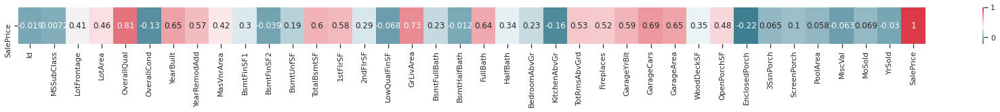

In [94]:
corr_train_data = train.select_dtypes(exclude='object')

# Spearman correlation
corr = corr_train_data.corr(method='spearman')
f, ax = plt.subplots(figsize=(30, 1))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(corr.sort_values(by=['SalePrice'], ascending=False).head(1), cmap=cmap, annot = True)

In [95]:
top_corr = corr['SalePrice'].sort_values(ascending=False).head(10).to_frame()
table_corr = top_corr.style.background_gradient(cmap=cmap)
table_corr

,SalePrice
SalePrice,1.000000
OverallQual,0.809829
GrLivArea,0.731310
GarageCars,0.690711
YearBuilt,0.652682
GarageArea,0.649379
FullBath,0.635957
TotalBsmtSF,0.602725
GarageYrBlt,0.593788
1stFlrSF,0.575408


**Let`s interpret results.**

* The living area, basement area, garage cars and garage area have the highest correlation values ​​with the sale price, which is logical, because better quality and bigger area means higher price.

* Also, for example, full bath has a higher correlation, it is luxury feature, and luxury obviously means higher price.

* And the age of the building (year build) defines sale price.


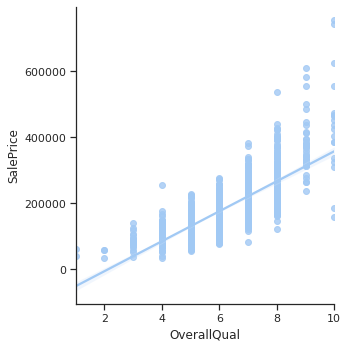

In [96]:
g = sns.lmplot(x="OverallQual", y="SalePrice", data=train)
g.set_axis_labels("OverallQual", "SalePrice")

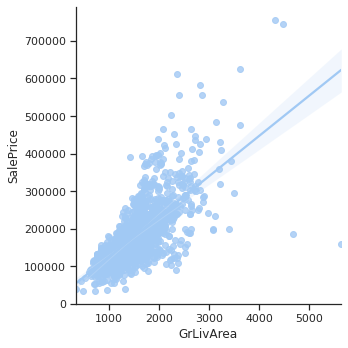

In [97]:
g = sns.lmplot(x="GrLivArea", y="SalePrice", data=train)
g.set_axis_labels("GrLivArea", "SalePrice")

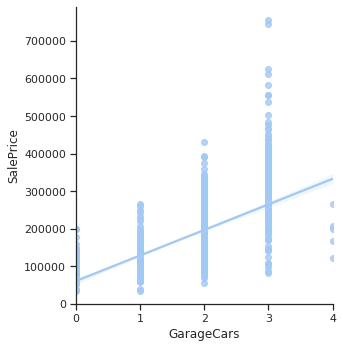

In [98]:
g = sns.lmplot(x="GarageCars", y="SalePrice", data=train)
g.set_axis_labels("GarageCars", "SalePrice")

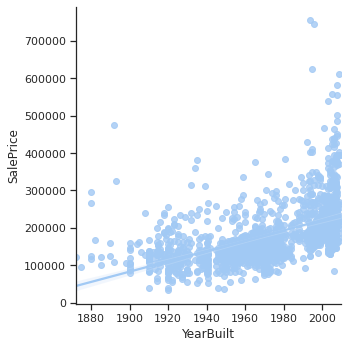

In [99]:
g = sns.lmplot(x="YearBuilt", y="SalePrice", data=train)
g.set_axis_labels("YearBuilt", "SalePrice")

Also, we need to explore and categorial features. For examle, BldgType (Type of dwelling),I think, may be very important.

[Text(0, 0, '1Fam'),
 Text(0, 0, 'TwnhsE'),
 Text(0, 0, 'Duplex'),
 Text(0, 0, 'Twnhs'),
 Text(0, 0, '2fmCon')]

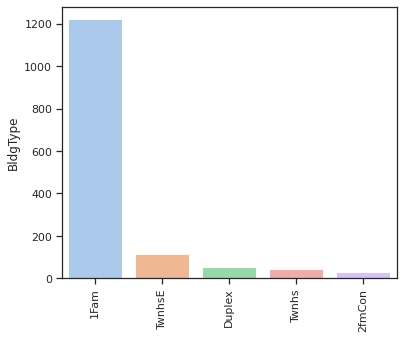

In [100]:
dwelling_types_count = train['BldgType'].value_counts().sort_values(ascending=False)
top_dwelling_types = pd.DataFrame(dwelling_types_count)
plt.figure(figsize=(6,5))
ax = sns.barplot(x = top_dwelling_types.index, y = 'BldgType' , data = top_dwelling_types)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

[Text(0, 0, 'NAmes'),
 Text(0, 0, 'CollgCr'),
 Text(0, 0, 'OldTown'),
 Text(0, 0, 'Edwards'),
 Text(0, 0, 'Somerst'),
 Text(0, 0, 'Gilbert'),
 Text(0, 0, 'NridgHt'),
 Text(0, 0, 'Sawyer'),
 Text(0, 0, 'NWAmes'),
 Text(0, 0, 'SawyerW'),
 Text(0, 0, 'BrkSide'),
 Text(0, 0, 'Crawfor'),
 Text(0, 0, 'Mitchel'),
 Text(0, 0, 'NoRidge'),
 Text(0, 0, 'Timber'),
 Text(0, 0, 'IDOTRR'),
 Text(0, 0, 'ClearCr'),
 Text(0, 0, 'StoneBr'),
 Text(0, 0, 'SWISU'),
 Text(0, 0, 'MeadowV'),
 Text(0, 0, 'Blmngtn'),
 Text(0, 0, 'BrDale'),
 Text(0, 0, 'Veenker'),
 Text(0, 0, 'NPkVill'),
 Text(0, 0, 'Blueste')]

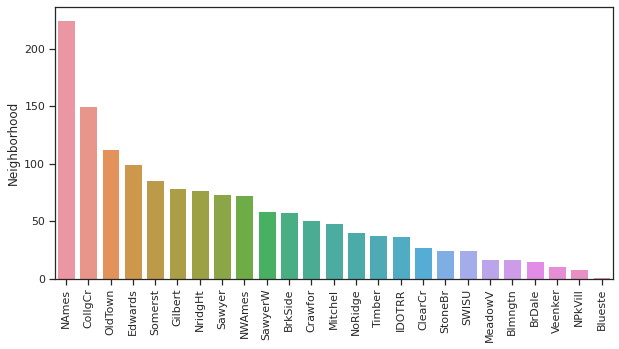

In [101]:
neighborhood_types_count = train['Neighborhood'].value_counts().sort_values(ascending=False)
top_neighborhood_types = pd.DataFrame(neighborhood_types_count)
plt.figure(figsize=(10,5))
ax = sns.barplot(x = top_neighborhood_types.index, y = 'Neighborhood' , data = top_neighborhood_types)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

See NaN values:

In [102]:
findNaN = train.isna().sum()
columns_NaN_train = findNaN.loc[findNaN != 0].to_frame()
table_NaN = columns_NaN_train.style.background_gradient(cmap=cmap)
table_NaN

,0
LotFrontage,259
Alley,1369
MasVnrType,8
MasVnrArea,8
BsmtQual,37
BsmtCond,37
BsmtExposure,38
BsmtFinType1,37
BsmtFinType2,38
Electrical,1


In [103]:
findNaN = test.isna().sum()
columns_NaN_test = findNaN.loc[findNaN != 0].to_frame()
table_NaN = columns_NaN_test.style.background_gradient(cmap=cmap)
table_NaN

,0
MSZoning,4
LotFrontage,227
Alley,1352
Utilities,2
Exterior1st,1
Exterior2nd,1
MasVnrType,16
MasVnrArea,15
BsmtQual,44
BsmtCond,45


Well, we have a lot of missing values in four columns (PoolQC, Fence, MiscFeature, Alley), and we can`t put values on it, because we have not information.
We will drop it.

For other columns, where we have a few missing values, we can put on values.

# **2 - Missing values**

In [106]:
test = test.drop(columns=['PoolQC', 'Fence', 'MiscFeature', 'Alley'])
train = train.drop(columns=['PoolQC', 'Fence', 'MiscFeature', 'Alley'])

In [107]:
train_test = pd.concat((train, test), sort=False).reset_index(drop=True)
# drop the target "SalePrice" and Id columns
train_test.drop(['Id'], axis=1, inplace=True)

In [108]:
train_test.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'WoodDeckSF'

In [109]:
train_test = train_test.dropna(thresh=len(train_test)*0.8, axis=1)
train_test.head(5)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706.0,Unf,0.0,150.0,856.0,GasA,Ex,Y,SBrkr,856,854,0,1710,1.0,0.0,2,1,3,1,Gd,8,Typ,0,Attchd,2003.0,RFn,2.0,548.0,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal
1,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.0,Unf,0.0,284.0,1262.0,GasA,Ex,Y,SBrkr,1262,0,0,1262,0.0,1.0,2,0,3,1,TA,6,Typ,1,Attchd,1976.0,RFn,2.0,460.0,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal
2,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.0,Unf,0.0,434.0,920.0,GasA,Ex,Y,SBrkr,920,866,0,1786,1.0,0.0,2,1,3,1,Gd,6,Typ,1,Attchd,2001.0,RFn,2.0,608.0,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal
3,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216.0,Unf,0.0,540.0,756.0,GasA,Gd,Y,SBrkr,961,756,0,1717,1.0,0.0,1,0,3,1,Gd,7,Typ,1,Detchd,1998.0,Unf,3.0,642.0,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml
4,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655.0,Unf,0.0,490.0,1145.0,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1.0,0.0,2,1,4,1,Gd,9,Typ,1,Attchd,2000.0,RFn,3.0,836.0,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal


In [110]:
findNaN = train_test.isna().sum()
columns_NaN = findNaN.loc[findNaN != 0].to_frame()
table_NaN = columns_NaN.style.background_gradient(cmap=cmap)
table_NaN

,0
MSZoning,4
LotFrontage,486
Utilities,2
Exterior1st,1
Exterior2nd,1
MasVnrType,24
MasVnrArea,23
BsmtQual,81
BsmtCond,82
BsmtExposure,82


In [111]:
nan_values = train_test[columns_NaN.index.to_list()]
nan_values.head()

,MSZoning,LotFrontage,Utilities,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Electrical,BsmtFullBath,BsmtHalfBath,KitchenQual,Functional,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,SaleType
0,RL,65.0,AllPub,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,No,GLQ,706.0,Unf,0.0,150.0,856.0,SBrkr,1.0,0.0,Gd,Typ,Attchd,2003.0,RFn,2.0,548.0,TA,TA,WD
1,RL,80.0,AllPub,MetalSd,MetalSd,None,0.0,Gd,TA,Gd,ALQ,978.0,Unf,0.0,284.0,1262.0,SBrkr,0.0,1.0,TA,Typ,Attchd,1976.0,RFn,2.0,460.0,TA,TA,WD
2,RL,68.0,AllPub,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,Mn,GLQ,486.0,Unf,0.0,434.0,920.0,SBrkr,1.0,0.0,Gd,Typ,Attchd,2001.0,RFn,2.0,608.0,TA,TA,WD
3,RL,60.0,AllPub,Wd Sdng,Wd Shng,None,0.0,TA,Gd,No,ALQ,216.0,Unf,0.0,540.0,756.0,SBrkr,1.0,0.0,Gd,Typ,Detchd,1998.0,Unf,3.0,642.0,TA,TA,WD
4,RL,84.0,AllPub,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,Av,GLQ,655.0,Unf,0.0,490.0,1145.0,SBrkr,1.0,0.0,Gd,Typ,Attchd,2000.0,RFn,3.0,836.0,TA,TA,WD


In [112]:
nan_objects = nan_values.select_dtypes(include='object')
nan_numbers = nan_values.select_dtypes(include='number')

In [113]:
nan_numbers.head()

,LotFrontage,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath,GarageYrBlt,GarageCars,GarageArea
0,65.0,196.0,706.0,0.0,150.0,856.0,1.0,0.0,2003.0,2.0,548.0
1,80.0,0.0,978.0,0.0,284.0,1262.0,0.0,1.0,1976.0,2.0,460.0
2,68.0,162.0,486.0,0.0,434.0,920.0,1.0,0.0,2001.0,2.0,608.0
3,60.0,0.0,216.0,0.0,540.0,756.0,1.0,0.0,1998.0,3.0,642.0
4,84.0,350.0,655.0,0.0,490.0,1145.0,1.0,0.0,2000.0,3.0,836.0


In [114]:
nan_objects.head()

,MSZoning,Utilities,Exterior1st,Exterior2nd,MasVnrType,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,SaleType
0,RL,AllPub,VinylSd,VinylSd,BrkFace,Gd,TA,No,GLQ,Unf,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,WD
1,RL,AllPub,MetalSd,MetalSd,None,Gd,TA,Gd,ALQ,Unf,SBrkr,TA,Typ,Attchd,RFn,TA,TA,WD
2,RL,AllPub,VinylSd,VinylSd,BrkFace,Gd,TA,Mn,GLQ,Unf,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,WD
3,RL,AllPub,Wd Sdng,Wd Shng,None,TA,Gd,No,ALQ,Unf,SBrkr,Gd,Typ,Detchd,Unf,TA,TA,WD
4,RL,AllPub,VinylSd,VinylSd,BrkFace,Gd,TA,Av,GLQ,Unf,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,WD


* So, we can presume that there is a lot of NaN-values and that ​​means absence feature (for example, it maybe means that the house has not got a garage or pool and etc).

* If we have a few of NaN-values we can use the forward fill method because they are obviously values that can't be filled with "None".

**It is rightly for all missing features (numbers, objects).**

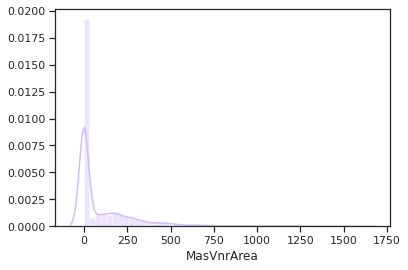

In [115]:
sns.distplot(train_test['MasVnrArea'], color="m")

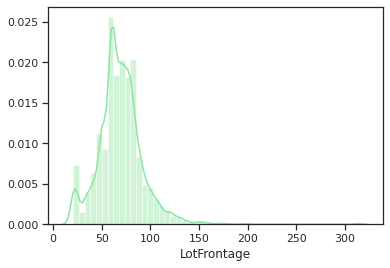

In [116]:
sns.distplot(train_test['LotFrontage'], color="g")

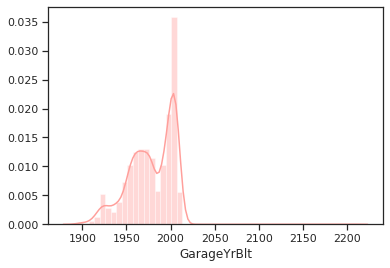

In [117]:
sns.distplot(train_test['GarageYrBlt'], color="r")

In [118]:
# masonry veneer area in square feet, the missing data means no veneer so we fill with '0'
train_test['MasVnrArea'] = train_test.MasVnrArea.fillna(0)

# lotFrontage has 486 missing values. We fill with the median
train_test['LotFrontage'] = train_test.LotFrontage.fillna(train_test.LotFrontage.median())

# garageYrBlt:  year garage was built, we fill the gaps with the median: 1980
train_test['GarageYrBlt'] = train_test["GarageYrBlt"].fillna(1980)

In [119]:
cols_fill = ['Electrical', 'SaleType', 'KitchenQual', 'Exterior1st',
             'Exterior2nd', 'Functional', 'Utilities', 'MSZoning']

for col in train_test[cols_fill]:
    train_test[col] = train_test[col].fillna(method='ffill')

In [120]:
# categorical missing values
nan_cols = train_test.columns
for col in nan_cols:
    if train_test[col].dtype == "object":
        train_test[col] = train_test[col].fillna("None")

# numerical missing values
for col in nan_cols:
    if train_test[col].dtype != "object":
        train_test[col]= train_test[col].fillna(0)

In [121]:
train_test.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706.0,Unf,0.0,150.0,856.0,GasA,Ex,Y,SBrkr,856,854,0,1710,1.0,0.0,2,1,3,1,Gd,8,Typ,0,Attchd,2003.0,RFn,2.0,548.0,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal
1,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.0,Unf,0.0,284.0,1262.0,GasA,Ex,Y,SBrkr,1262,0,0,1262,0.0,1.0,2,0,3,1,TA,6,Typ,1,Attchd,1976.0,RFn,2.0,460.0,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal
2,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.0,Unf,0.0,434.0,920.0,GasA,Ex,Y,SBrkr,920,866,0,1786,1.0,0.0,2,1,3,1,Gd,6,Typ,1,Attchd,2001.0,RFn,2.0,608.0,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal
3,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216.0,Unf,0.0,540.0,756.0,GasA,Gd,Y,SBrkr,961,756,0,1717,1.0,0.0,1,0,3,1,Gd,7,Typ,1,Detchd,1998.0,Unf,3.0,642.0,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml
4,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655.0,Unf,0.0,490.0,1145.0,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1.0,0.0,2,1,4,1,Gd,9,Typ,1,Attchd,2000.0,RFn,3.0,836.0,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal


In [122]:
train_test.isnull().sum().sort_values(ascending=False).head()

SaleCondition    0
YearRemodAdd     0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
dtype: int64

# **3- Feature engineering, feature selection**

Check our target value (Sale Price):

[Text(0.5, 1.0, 'SalePrice distribution')]

<Figure size 432x288 with 0 Axes>

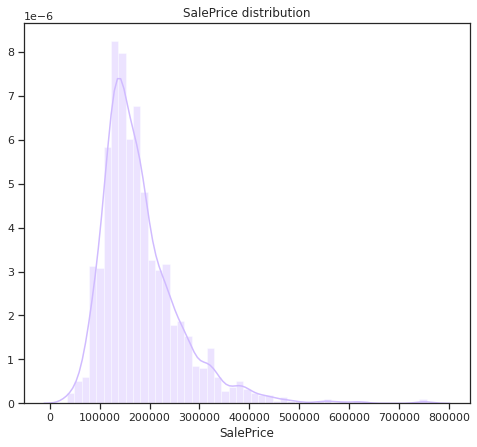

In [123]:
sns.despine(trim=True, left=True)
f, ax = plt.subplots(figsize=(8, 7))
# check the new distribution 
sns.distplot(train['SalePrice'], color="m");
ax.xaxis.grid(False)
ax.set(title="SalePrice distribution")

So, Sale Price has right skew. It`s not okay for most of ML models. 

In [124]:
train["SalePrice"] = np.log1p(train["SalePrice"])


 mu = 12.02 and sigma = 0.40



[Text(0.5, 1.0, 'SalePrice distribution')]

<Figure size 432x288 with 0 Axes>

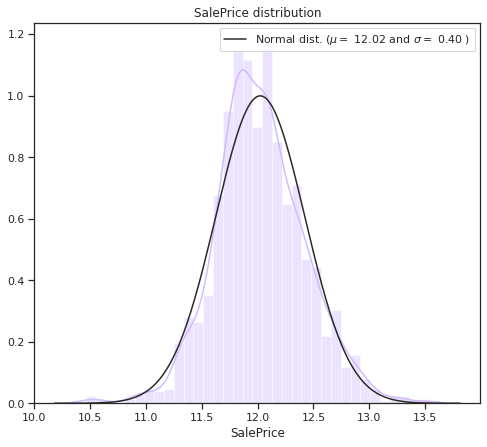

In [126]:
from scipy.stats import skew, norm

sns.despine(trim=True, left=True)
f, ax = plt.subplots(figsize=(8, 7))
sns.distplot(train['SalePrice'] , fit=norm, color="m");

# get the fitted parameters used by the function
(mu, sigma) = norm.fit(train['SalePrice'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

# now plot the distribution with mu = mu-Sale-Price and sigma = sigma-Sale-Price
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
ax.xaxis.grid(False)
ax.set(title="SalePrice distribution")

Well, it looks like normal distribution.

Now explore skew of other features.

In [127]:
numeric_dtypes = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
numeric = []
for i in train_test.columns:
    if train_test[i].dtype in numeric_dtypes:
        numeric.append(i)

In [128]:
skew_features = train_test[numeric].apply(lambda x: skew(x)).sort_values(ascending=False)

high_skew = skew_features[skew_features > 0.5]
skew_index = high_skew.index

print("There are {} numerical features with Skew > 0.5 :".format(high_skew.shape[0]))
skewness = pd.DataFrame({'Skew' :high_skew})
table_skewness = skewness.style.background_gradient(cmap=cmap)
table_skewness

There are 26 numerical features with Skew > 0.5 :


,Skew
MiscVal,21.947195
PoolArea,16.898328
LotArea,12.822431
LowQualFinSF,12.088761
3SsnPorch,11.376065
KitchenAbvGr,4.302254
BsmtFinSF2,4.146143
EnclosedPorch,4.003891
ScreenPorch,3.946694
BsmtHalfBath,3.931594


In [129]:
# create some useful features

train_test['BsmtFinType1_Unf'] = 1*(train_test['BsmtFinType1'] == 'Unf')


train_test['YearsSinceRemodel'] = train_test['YrSold'].astype(int) - train_test['YearRemodAdd'].astype(int)
train_test['Total_Home_Quality'] = train_test['OverallQual'] + train_test['OverallCond']
train_test['TotalSF'] = train_test['TotalBsmtSF'] + train_test['1stFlrSF'] + train_test['2ndFlrSF']
train_test['YrBltAndRemod'] = train_test['YearBuilt'] + train_test['YearRemodAdd']

train_test['Total_sqr_footage'] = (train_test['BsmtFinSF1'] + train_test['BsmtFinSF2'] +
                                 train_test['1stFlrSF'] + train_test['2ndFlrSF'])
train_test['Total_Bathrooms'] = (train_test['FullBath'] + (0.5 * train_test['HalfBath']) +
                               train_test['BsmtFullBath'] + (0.5 * train_test['BsmtHalfBath']))
train_test['Total_porch_sf'] = (train_test['OpenPorchSF'] + train_test['3SsnPorch'] +
                              train_test['EnclosedPorch'] + train_test['ScreenPorch'] +
                              train_test['WoodDeckSF'])

Normalize the data with the Box-Cox transformation:

In [130]:
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax

for i in skew_index:
    train_test[i] = boxcox1p(train_test[i], boxcox_normmax(train_test[i] + 1))

Categorical features:

In [131]:
categorical_dtypes = ['object']
categorical = []
for i in train_test.columns:
    if train_test[i].dtype in categorical_dtypes:
        categorical.append(i)

In [48]:
! pip install category_encoders

     |████████████████████████████████| 81kB 3.9MB/s 


In [49]:
# see different categorical encoders

from category_encoders.ordinal import OrdinalEncoder
from category_encoders.woe import WOEEncoder
from category_encoders.target_encoder import TargetEncoder
from category_encoders.sum_coding import SumEncoder
from category_encoders.m_estimate import MEstimateEncoder
from category_encoders.leave_one_out import LeaveOneOutEncoder
from category_encoders.helmert import HelmertEncoder
from category_encoders.cat_boost import CatBoostEncoder
from category_encoders.james_stein import JamesSteinEncoder
from category_encoders.one_hot import OneHotEncoder

In [136]:
# try, for example, MEE encoder
# TO DO: create notebook and explore encoders 

MEE_encoder = MEstimateEncoder()

train_mee = MEE_encoder.fit_transform(train_test[categorical][:1460], train['SalePrice'])
test_mee = MEE_encoder.transform(train_test[categorical][1460:])

In [138]:
train_test_mee = pd.concat((train_mee, test_mee), sort=False).reset_index(drop=True)

In [139]:
train_test[categorical] = train_test_mee[categorical]

In [140]:
train_test.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,BsmtFinType1_Unf,YearsSinceRemodel,Total_Home_Quality,TotalSF,YrBltAndRemod,Total_sqr_footage,Total_Bathrooms,Total_porch_sf
0,6.502440,12.085837,13.360621,13.424520,12.025528,11.936196,12.022701,12.024189,12.001927,12.020574,12.162722,12.042908,12.0259,12.0475,12.182336,7,3.989638,2003,2003,11.984241,12.019226,12.205526,12.209268,12.163322,19.378557,12.310700,12.043069,12.261303,12.179636,12.042607,11.955732,12.301279,117.855863,12.043729,0.0,30.016555,296.832338,12.032079,12.207384,12.061069,12.061418,5.318379,1019.540733,0.0,7.234115,0.992784,0.00000,2,1.069352,3,0.75096,12.222004,2.238463,12.038507,0.000000,12.160626,2003.0,12.172326,2.0,548.0,12.068512,12.070454,12.059874,0.000000,12.009558,0.000000,0.0,0.0,0.0,0.0,2,2008,11.991094,12.005056,0,5,12,2566.0,4006,2416.0,3.5,61
1,4.250991,12.085837,14.945970,13.694527,12.025528,11.936196,12.022701,12.024189,12.034525,12.020574,12.317503,11.820850,12.0259,12.0475,11.993731,6,5.996435,1976,1976,11.984241,12.019226,11.860518,11.863046,11.897037,0.000000,11.838198,12.043069,11.870330,12.179636,12.042607,12.361843,11.953640,146.805798,12.043729,0.0,44.178889,407.302427,12.032079,12.207384,12.061069,12.061418,5.550627,0.000000,0.0,6.947212,0.000000,0.71081,2,0.000000,3,0.75096,11.810890,1.978208,12.038507,0.900816,12.160626,1976.0,12.172326,2.0,460.0,12.068512,12.070454,12.059874,56.339208,0.000000,0.000000,0.0,0.0,0.0,0.0,5,2007,11.991094,12.005056,0,31,14,2524.0,3952,2240.0,2.5,298
2,6.502440,12.085837,13.691701,14.034133,12.025528,12.163184,12.022701,12.024189,12.001927,12.020574,12.162722,12.042908,12.0259,12.0475,12.182336,7,3.989638,2001,2002,11.984241,12.019226,12.205526,12.209268,12.163322,17.721069,12.310700,12.043069,12.261303,12.179636,12.042607,12.094210,12.301279,91.575284,12.043729,0.0,56.957796,314.805067,12.032079,12.207384,12.061069,12.061418,5.362015,1034.306417,0.0,7.275132,0.992784,0.00000,2,1.069352,3,0.75096,12.222004,1.978208,12.038507,0.900816,12.160626,2001.0,12.172326,2.0,608.0,12.068512,12.070454,12.059874,0.000000,9.849185,0.000000,0.0,0.0,0.0,0.0,9,2008,11.991094,12.005056,0,6,12,2706.0,4003,2272.0,3.5,42
3,6.865584,12.085837,12.790819,13.683421,12.025528,12.163184,12.022701,12.024189,12.027439,12.020574,12.203152,12.042908,12.0259,12.0475,12.182336,7,3.989638,1915,1970,11.984241,12.019226,11.839410,11.895629,11.897037,0.000000,11.838198,12.043069,11.724588,11.811191,12.217311,11.955732,11.953640,52.776367,12.043729,0.0,64.881737,268.234296,12.032079,11.910847,12.061069,12.061418,5.388291,899.200533,0.0,7.237969,0.992784,0.00000,1,0.000000,3,0.75096,12.222004,2.116352,12.038507,0.900816,11.766317,1998.0,11.819320,3.0,642.0,12.068512,12.070454,12.059874,0.000000,8.921746,16.012025,0.0,0.0,0.0,0.0,2,2006,11.991094,11.791089,0,36,12,2473.0,3885,1933.0,2.0,307
4,6.502440,12.085837,15.342157,14.550142,12.025528,12.163184,12.022701,12.024189,12.034525,12.020574,12.660481,12.042908,12.0259,12.0475,12.182336,8,3.989638,2000,2000,11.984241,12.019226,12.205526,12.209268,12.163322,25.323127,12.310700,12.043069,12.261303,12.179636,12.042607,12.157668,12.301279,112.040325,12.043729,0.0,61.233859,376.259375,12.032079,12.207384,12.061069,12.061418,5.493032,1265.167706,0.0,7.470741,0.

Feature selection based on correlation results:

In [141]:
# for convenient

top_corr = corr['SalePrice'].sort_values(ascending=False).head(10).to_frame()
table_corr = top_corr.style.background_gradient(cmap=cmap)
table_corr

,SalePrice
SalePrice,1.000000
OverallQual,0.809829
GrLivArea,0.731310
GarageCars,0.690711
YearBuilt,0.652682
GarageArea,0.649379
FullBath,0.635957
TotalBsmtSF,0.602725
GarageYrBlt,0.593788
1stFlrSF,0.575408


In [144]:
#  drop hight correlation

train_test.drop(columns=['OverallQual'])

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,BsmtFinType1_Unf,YearsSinceRemodel,Total_Home_Quality,TotalSF,YrBltAndRemod,Total_sqr_footage,Total_Bathrooms,Total_porch_sf
0,6.502440,12.085837,13.360621,13.424520,12.025528,11.936196,12.022701,12.024189,12.001927,12.020574,12.162722,12.042908,12.025900,12.047500,12.182336,3.989638,2003,2003,11.984241,12.019226,12.205526,12.209268,12.163322,19.378557,12.310700,12.043069,12.261303,12.179636,12.042607,11.955732,12.301279,117.855863,12.043729,0.000000,30.016555,296.832338,12.032079,12.207384,12.061069,12.061418,5.318379,1019.540733,0.000000,7.234115,0.992784,0.000000,2,1.069352,3,0.750960,12.222004,2.238463,12.038507,0.000000,12.160626,2003.0,12.172326,2.0,548.0,12.068512,12.070454,12.059874,0.000000,12.009558,0.000000,0.000000,0.000000,0.000000,0.000000,2,2008,11.991094,12.005056,0,5,12,2566.0,4006,2416.0,3.5,61
1,4.250991,12.085837,14.945970,13.694527,12.025528,11.936196,12.022701,12.024189,12.034525,12.020574,12.317503,11.820850,12.025900,12.047500,11.993731,5.996435,1976,1976,11.984241,12.019226,11.860518,11.863046,11.897037,0.000000,11.838198,12.043069,11.870330,12.179636,12.042607,12.361843,11.953640,146.805798,12.043729,0.000000,44.178889,407.302427,12.032079,12.207384,12.061069,12.061418,5.550627,0.000000,0.000000,6.947212,0.000000,0.710810,2,0.000000,3,0.750960,11.810890,1.978208,12.038507,0.900816,12.160626,1976.0,12.172326,2.0,460.0,12.068512,12.070454,12.059874,56.339208,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5,2007,11.991094,12.005056,0,31,14,2524.0,3952,2240.0,2.5,298
2,6.502440,12.085837,13.691701,14.034133,12.025528,12.163184,12.022701,12.024189,12.001927,12.020574,12.162722,12.042908,12.025900,12.047500,12.182336,3.989638,2001,2002,11.984241,12.019226,12.205526,12.209268,12.163322,17.721069,12.310700,12.043069,12.261303,12.179636,12.042607,12.094210,12.301279,91.575284,12.043729,0.000000,56.957796,314.805067,12.032079,12.207384,12.061069,12.061418,5.362015,1034.306417,0.000000,7.275132,0.992784,0.000000,2,1.069352,3,0.750960,12.222004,1.978208,12.038507,0.900816,12.160626,2001.0,12.172326,2.0,608.0,12.068512,12.070454,12.059874,0.000000,9.849185,0.000000,0.000000,0.000000,0.000000,0.000000,9,2008,11.991094,12.005056,0,6,12,2706.0,4003,2272.0,3.5,42
3,6.865584,12.085837,12.790819,13.683421,12.025528,12.163184,12.022701,12.024189,12.027439,12.020574,12.203152,12.042908,12.025900,12.047500,12.182336,3.989638,1915,1970,11.984241,12.019226,11.839410,11.895629,11.897037,0.000000,11.838198,12.043069,11.724588,11.811191,12.217311,11.955732,11.953640,52.776367,12.043729,0.000000,64.881737,268.234296,12.032079,11.910847,12.061069,12.061418,5.388291,899.200533,0.000000,7.237969,0.992784,0.000000,1,0.000000,3,0.750960,12.222004,2.116352,12.038507,0.900816,11.766317,1998.0,11.819320,3.0,642.0,12.068512,12.070454,12.059874,0.000000,8.921746,16.012025,0.000000,0.000000,0.000000,0.000000,2,2006,11.991094,11.791089,0,36,12,2473.0,3885,1933.0,2.0,307
4,6.502440,12.085837,15.342157,14.550142,12.025528,12.163184,12.022701,12.024189,12.034525,12.020574,12.660481,12.042908,12.025900,12.047500,12.182336,3.989638,2000,2000,11.984241,12.019226,12.205526,12.209268,12.163322,25.323127,12.310700,12.043069,12.261303,12.179636,12.042607,12.157668,12.301

In [145]:
train_test.shape

(2919, 82)

# **Model Selection**

In [146]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, BaggingRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.linear_model import ElasticNet, ElasticNetCV
from sklearn.svm import SVR
from mlxtend.regressor import StackingCVRegressor
import lightgbm as lgb
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor


from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import scale
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.decomposition import PCA

In [157]:
train_labels = train['SalePrice'].reset_index(drop=True)


X = train_test.iloc[:len(train_labels), :]
X_test = train_test.iloc[len(train_labels):, :]
X.shape, train_labels.shape, X_test.shape

((1460, 82), (1460,), (1459, 82))

In [147]:
kf = KFold(n_splits=12, random_state=42, shuffle=True)

In [158]:
# define error metrics

def rmsle(y, y_pred):
    return np.sqrt(mean_squared_error(y, y_pred))

def cv_rmse(model, X=X):
    rmse = np.sqrt(-cross_val_score(model, X, train_labels, scoring="neg_mean_squared_error", cv=kf))
    return (rmse)

In [221]:
# Light Gradient Boosting Regressor
lightgbm = LGBMRegressor(objective='regression', 
                       num_leaves=6,
                       learning_rate=0.01, 
                       n_estimators=7000,
                       max_bin=200, 
                       bagging_fraction=0.8,
                       bagging_freq=4, 
                       bagging_seed=8,
                       feature_fraction=0.2,
                       feature_fraction_seed=8,
                       min_sum_hessian_in_leaf = 11,
                       verbose=-1,
                       random_state=42)

# XGBoost Regressor
xgboost = XGBRegressor(learning_rate=0.02,
                       n_estimators=6000,
                       max_depth=3,
                       min_child_weight=1,
                       gamma=0.2,
                       subsample=0.7,
                       colsample_bytree=0.7,
                       objective='reg:linear',
                       nthread=-1,
                       scale_pos_weight=1,
                       seed=27,
                       reg_alpha=0.00006,
                       random_state=42)

# Ridge Regressor
ridge_alphas = [1e-15, 1e-10, 1e-8, 9e-4, 7e-4, 5e-4, 3e-4, 1e-4, 1e-3, 5e-2, 1e-2, 0.1, 0.3, 1, 3, 5, 10, 15, 18, 20, 30, 50, 75, 100]
ridge = make_pipeline(RobustScaler(), RidgeCV(alphas=ridge_alphas, cv=kf))

# Support Vector Regressor
svr = make_pipeline(RobustScaler(), SVR(C= 20, epsilon= 0.008, gamma=0.0003))

# Gradient Boosting Regressor
gbr = GradientBoostingRegressor(n_estimators=6000,
                                learning_rate=0.01,
                                max_depth=4,
                                max_features='sqrt',
                                min_samples_leaf=15,
                                min_samples_split=10,
                                loss='huber',
                                random_state=42)  

# Random Forest Regressor
rf = RandomForestRegressor(n_estimators=1200,
                          max_depth=15,
                          min_samples_split=5,
                          min_samples_leaf=5,
                          max_features=None,
                          oob_score=True,
                          random_state=42)

# Stack up all the models above, optimized using xgboost
stack_gen = StackingCVRegressor(regressors=(xgboost, lightgbm, svr, gbr),
                                meta_regressor=xgboost,
                                use_features_in_secondary=True)

Train models:

In [161]:
import warnings
warnings.filterwarnings(action="ignore")

In [159]:
scores = {}

score = cv_rmse(lightgbm)
print("lightgbm: {:.4f} ({:.4f})".format(score.mean(), score.std()))
scores['lgb'] = (score.mean(), score.std())

lightgbm: 0.1189 (0.0190)


In [183]:
score = cv_rmse(xgboost)
print("xgboost: {:.4f} ({:.4f})".format(score.mean(), score.std()))
scores['xgb'] = (score.mean(), score.std())

[18:58:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:58:29] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:58:41] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:58:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:59:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:59:18] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:59:30] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:59:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

In [163]:
score = cv_rmse(svr)
print("SVR: {:.4f} ({:.4f})".format(score.mean(), score.std()))
scores['svr'] = (score.mean(), score.std())

SVR: 0.1267 (0.0389)


In [164]:
score = cv_rmse(ridge)
print("ridge: {:.4f} ({:.4f})".format(score.mean(), score.std()))
scores['ridge'] = (score.mean(), score.std())

ridge: 0.1275 (0.0266)


In [165]:
score = cv_rmse(rf)
print("rf: {:.4f} ({:.4f})".format(score.mean(), score.std()))
scores['rf'] = (score.mean(), score.std())

rf: 0.1343 (0.0225)


In [166]:
score = cv_rmse(gbr)
print("gbr: {:.4f} ({:.4f})".format(score.mean(), score.std()))
scores['gbr'] = (score.mean(), score.std())

gbr: 0.1169 (0.0240)


Fit models:

In [222]:
stack_gen_model = stack_gen.fit(np.array(X), np.array(train_labels))
lgb_model_full_data = lightgbm.fit(X, train_labels)
xgb_model_full_data = xgboost.fit(X, train_labels)
svr_model_full_data = svr.fit(X, train_labels)
#ridge_model_full_data = ridge.fit(X, train_labels)
#rf_model_full_data = rf.fit(X, train_labels)
gbr_model_full_data = gbr.fit(X, train_labels)

[19:14:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[19:14:37] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[19:14:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[19:14:59] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[19:15:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[19:17:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[19:17:22] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[19:18:02] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

Blend models and get predictions

In [235]:
# Blend models in order to make the final predictions more robust to overfitting
def blended_predictions(X):
    return (
            (0.1 * svr_model_full_data.predict(X)) + \
            (0.2 * gbr_model_full_data.predict(X)) + \
            (0.1 * xgb_model_full_data.predict(X)) + \
            (0.2 * lgb_model_full_data.predict(X)) + \
            
            (0.4 * stack_gen_model.predict(np.array(X))))

In [236]:
# get final precitions from the blended model

blended_score = rmsle(train_labels, blended_predictions(X))
scores['blended'] = (blended_score, 0)
print('RMSLE score on train data:')
print(blended_score)

RMSLE score on train data:
0.0649810286444321


In [237]:
# Read in sample_submission dataframe
submission = pd.read_csv("sample_submission.csv")
submission.shape

(1459, 2)

In [238]:
# Append predictions from blended models
submission.iloc[:,1] = np.floor(np.expm1(blended_predictions(X_test)))

In [239]:
# Fix outleir predictions
q1 = submission['SalePrice'].quantile(0.0045)
q2 = submission['SalePrice'].quantile(0.99)
submission['SalePrice'] = submission['SalePrice'].apply(lambda x: x if x > q1 else x*0.77)
submission['SalePrice'] = submission['SalePrice'].apply(lambda x: x if x < q2 else x*1.1)
submission.to_csv("submission_regression1.csv", index=False)

In [240]:
# Scale predictions
submission['SalePrice'] *= 1.001619
submission.to_csv("submission_regression2.csv", index=False)